In [ ]:
!pip install pybaseball

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.1/426.1 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.4/354.4 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 856.7/856.7 kB 12.0 MB/s eta 0:00:00
  Attempting uninstall: pyjwt
    Found existing installation: PyJWT 2.3.0
    Uninstalling PyJWT-2.3.0:
      Successfully uninstalled PyJWT-2.3.0


# Max Scherzer

In [ ]:
from pybaseball import statcast_pitcher, playerid_lookup
import pandas as pd

def get_pitcher_data(last_name, first_name, start_year, end_year):
    # Find the player's MLBAM ID
    player_info = playerid_lookup(last_name, first_name)
    player_id = player_info.iloc[0]['key_mlbam']

    # Function to get data for multiple seasons
    def get_pitcher_data_season(player_id, year):
        data = statcast_pitcher(f"{year}-01-01", f"{year}-12-31", player_id)
        data['year'] = year
        return data

    # Get data for each year in the specified range
    all_data = [get_pitcher_data_season(player_id, year) for year in range(start_year, end_year + 1)]
    pitcher_data = pd.concat(all_data, ignore_index=True)

    return pitcher_data

# Gather Max Scherzer's pitching data for the desired five-year range
scherzer_data = get_pitcher_data('scherzer', 'max', 2019, 2023)

# Display the first few rows of the DataFrame
print("Max Scherzer's Pitching Data:")
print(scherzer_data.head())

Gathering player lookup table. This may take a moment.
Gathering Player Data
Gathering Player Data
Gathering Player Data
Gathering Player Data
Gathering Player Data
Max Scherzer's Pitching Data:
  pitch_type   game_date  release_speed  release_pos_x  release_pos_z  \
0         CH  2019-10-30           85.3          -3.47           5.11   
1         FF  2019-10-30           95.3          -3.31           5.27   
2         FF  2019-10-30           94.5          -3.35           5.26   
3         SL  2019-10-30           82.8          -3.54           5.01   
4         FF  2019-10-30           94.9          -3.50           5.05   

     player_name  batter  pitcher     events              description  ...  \
0  Scherzer, Max  455139   453286  strikeout  swinging_strike_blocked  ...   
1  Scherzer, Max  455139   453286        NaN                     ball  ...   
2  Scherzer, Max  455139   453286        NaN            called_strike  ...   
3  Scherzer, Max  455139   453286        NaN          

In [ ]:
# Filter by pitch type
pitch_types = ['FF', 'CU', 'SL', 'CH']
scherzer_pitch = scherzer_data[scherzer_data['pitch_type'].isin(pitch_types)]

# Define the columns to include in the subset
subset = ['pitch_type', 'game_date', 'release_speed', 'effective_speed', 'release_pos_x', 'release_pos_y', 'release_pos_z', 'pfx_x', 'pfx_z', 'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'release_spin_rate', 'spin_axis']

# Create the new subset by filtering the DataFrame
scherzer_filtered = scherzer_pitch[subset]

# Drop rows with missing values
scherzer_dropna = scherzer_filtered.dropna()

#final subset with primary vars of interest
new_subset = ['pitch_type', 'game_date','release_speed', 'pfx_x', 'pfx_z', 'ax', 'ay', 'release_spin_rate']
scherzer_data = scherzer_dropna[new_subset]

In [ ]:
# Check data dimensions
scherzer_data.shape

(11658, 8)

# Max Scherzer plots

<ipython-input-4-602d66afd475>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scherzer_data['game_date'] = pd.to_datetime(scherzer_data['game_date'])
<ipython-input-4-602d66afd475>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scherzer_data['year'] = scherzer_data['game_date'].dt.year


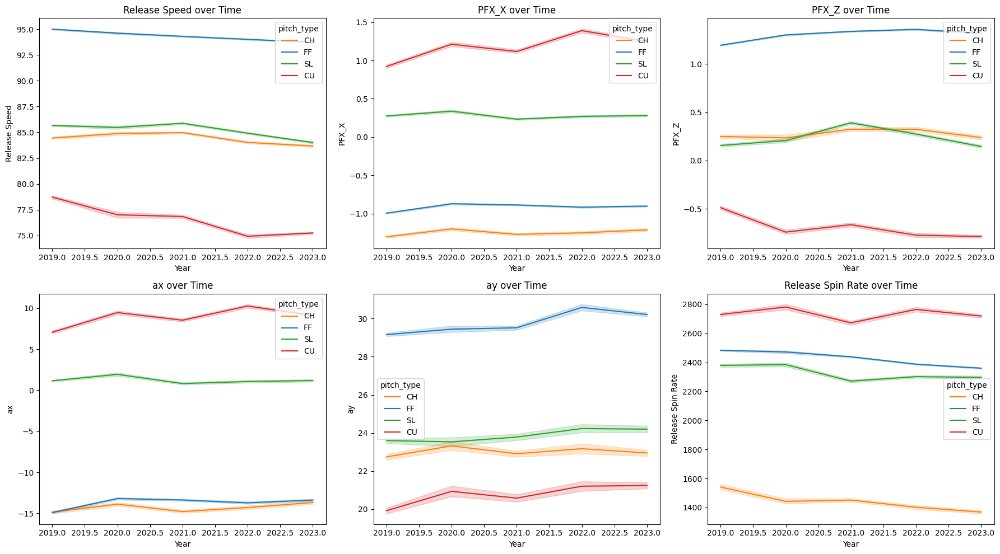

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Custom color palette for the pitch types
pitch_palette = {
    'FF': '#1f77b4',  # Blue
    'CH': '#ff7f0e',  # Orange
    'SL': '#2ca02c',  # Green
    'CU': '#d62728'   # Red
}

# Convert game_date to datetime
scherzer_data['game_date'] = pd.to_datetime(scherzer_data['game_date'])

# Extract year
scherzer_data['year'] = scherzer_data['game_date'].dt.year

# Create a 2x4 grid for subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Line plot for Release Speed over Time
sns.lineplot(data=scherzer_data, x='year', y='release_speed', hue='pitch_type', ax=axes[0, 0], palette=pitch_palette)
axes[0, 0].set_title('Release Speed over Time')
axes[0, 0].set_xlabel('Year')
axes[0, 0].set_ylabel('Release Speed')

# Line plot for PFX_X over Time
sns.lineplot(data=scherzer_data, x='year', y='pfx_x', hue='pitch_type', ax=axes[0, 1], palette=pitch_palette)
axes[0, 1].set_title('PFX_X over Time')
axes[0, 1].set_xlabel('Year')
axes[0, 1].set_ylabel('PFX_X')

# Line plot for PFX_Z over Time
sns.lineplot(data=scherzer_data, x='year', y='pfx_z', hue='pitch_type', ax=axes[0, 2], palette=pitch_palette)
axes[0, 2].set_title('PFX_Z over Time')
axes[0, 2].set_xlabel('Year')
axes[0, 2].set_ylabel('PFX_Z')

# Line plot for ax over Time
sns.lineplot(data=scherzer_data, x='year', y='ax', hue='pitch_type', ax=axes[1, 0], palette=pitch_palette)
axes[1, 0].set_title('ax over Time')
axes[1, 0].set_xlabel('Year')
axes[1, 0].set_ylabel('ax')

# Line plot for ay over Time
sns.lineplot(data=scherzer_data, x='year', y='ay', hue='pitch_type', ax=axes[1, 1], palette=pitch_palette)
axes[1, 1].set_title('ay over Time')
axes[1, 1].set_xlabel('Year')
axes[1, 1].set_ylabel('ay')

# Line plot for Release Spin Rate over Time
sns.lineplot(data=scherzer_data, x='year', y='release_spin_rate', hue='pitch_type', ax=axes[1, 2], palette=pitch_palette)
axes[1, 2].set_title('Release Spin Rate over Time')
axes[1, 2].set_xlabel('Year')
axes[1, 2].set_ylabel('Release Spin Rate')

# Adjust layout
plt.tight_layout()
plt.show()


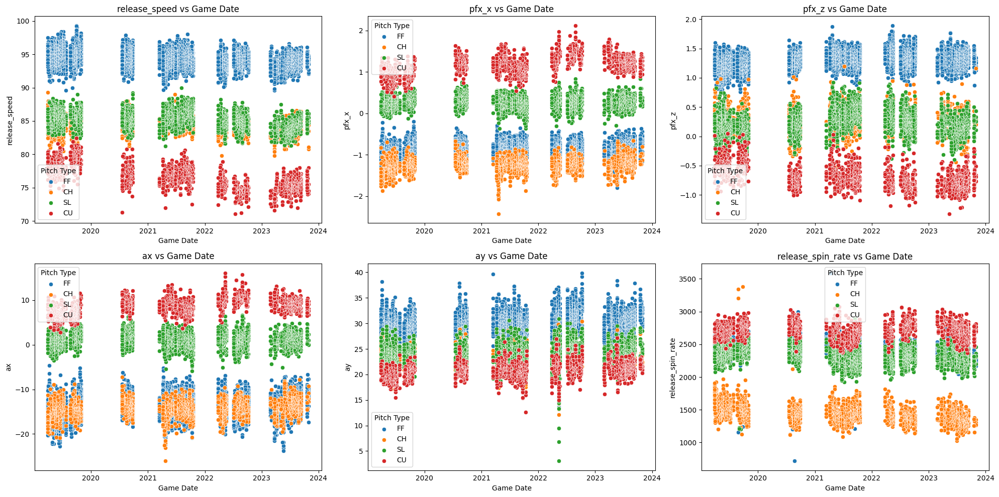

In [ ]:
# Define the list of variables
variables = ['release_speed', 'pfx_x', 'pfx_z', 'ax', 'ay', 'release_spin_rate']

# Custom color palette for the pitch types
pitch_palette = {
    'FF': '#1f77b4',  # Blue
    'CH': '#ff7f0e',  # Orange
    'SL': '#2ca02c',  # Green
    'CU': '#d62728'   # Red
}

# Create a 2x4 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate over each variable and create scatter plots
for i, var in enumerate(variables):
    # Scatter plot for the current variable
    for pitch_type, color in pitch_palette.items():
        data_filtered = scherzer_data[scherzer_data['pitch_type'] == pitch_type]
        sns.scatterplot(data=data_filtered, x='game_date', y=var, ax=axes[i], color=color, label=pitch_type)
    axes[i].set_title(f'{var} vs Game Date')
    axes[i].set_xlabel('Game Date')
    axes[i].set_ylabel(var)
    axes[i].legend(title='Pitch Type')

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-6-9e2c0a3ff9bb>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')


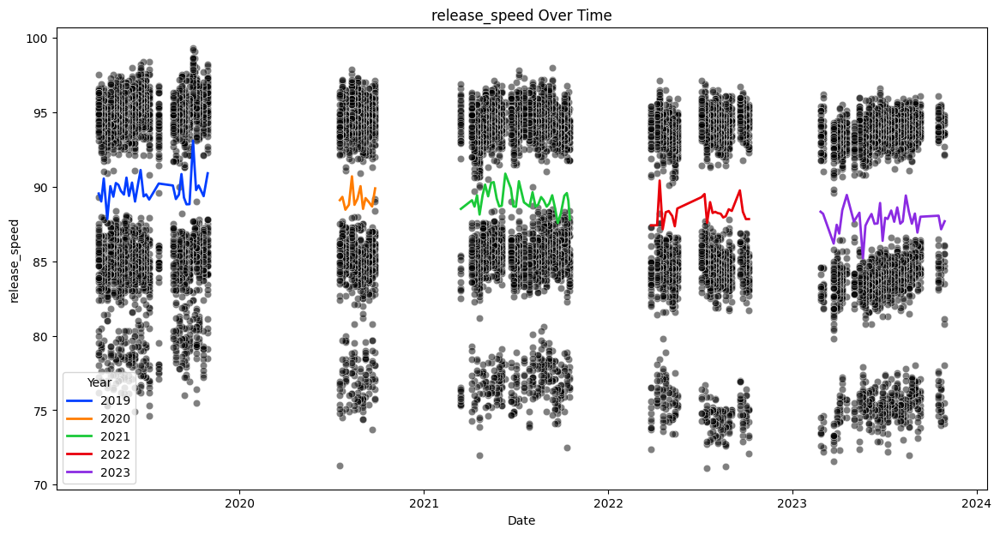

<ipython-input-6-9e2c0a3ff9bb>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')


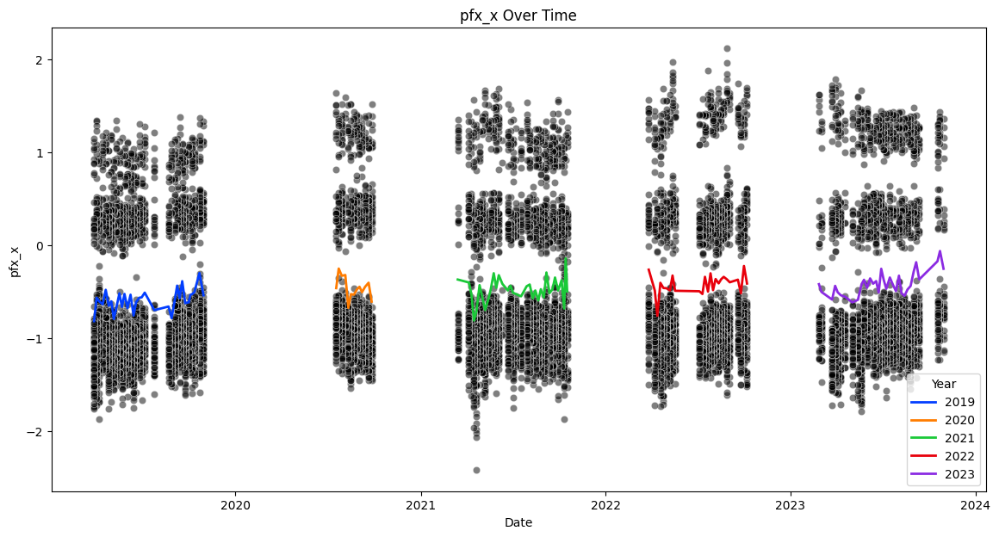

<ipython-input-6-9e2c0a3ff9bb>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')


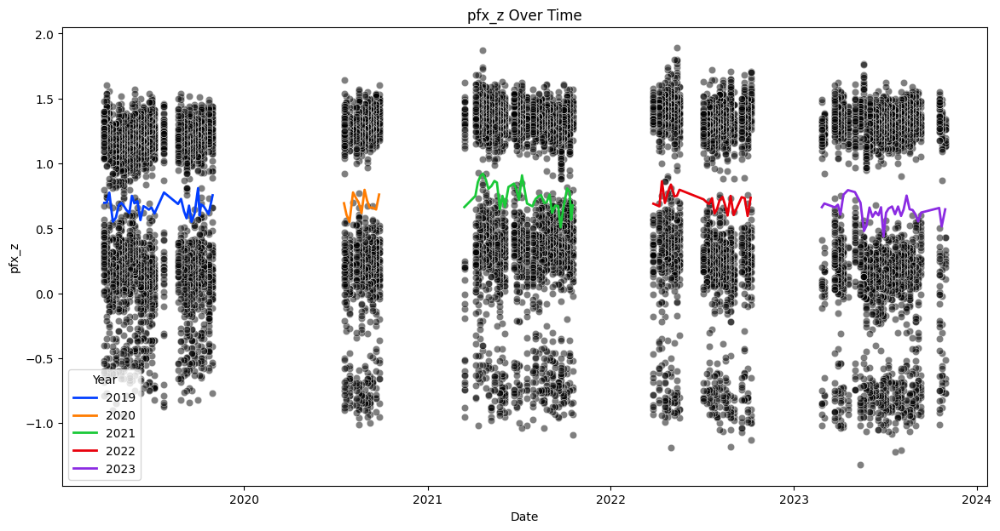

<ipython-input-6-9e2c0a3ff9bb>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')


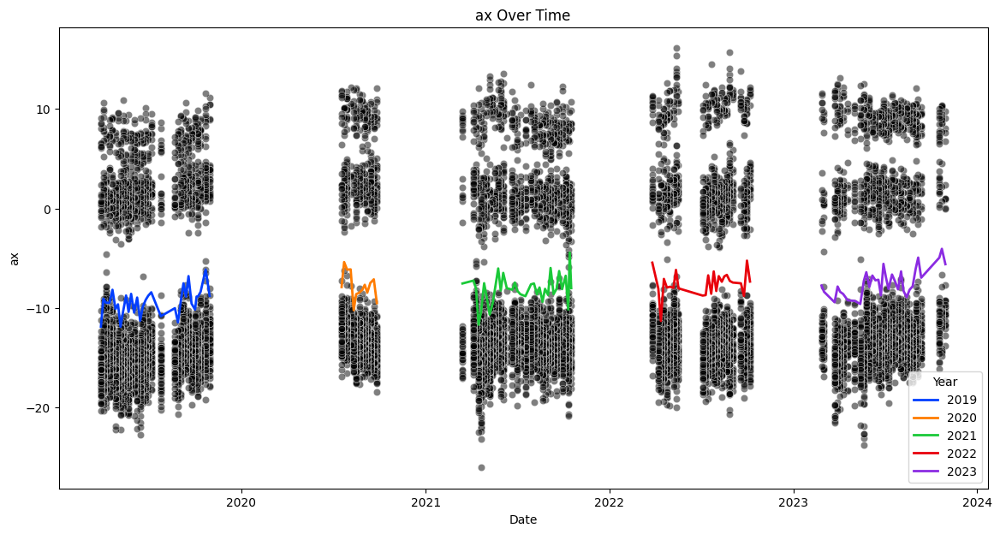

<ipython-input-6-9e2c0a3ff9bb>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')


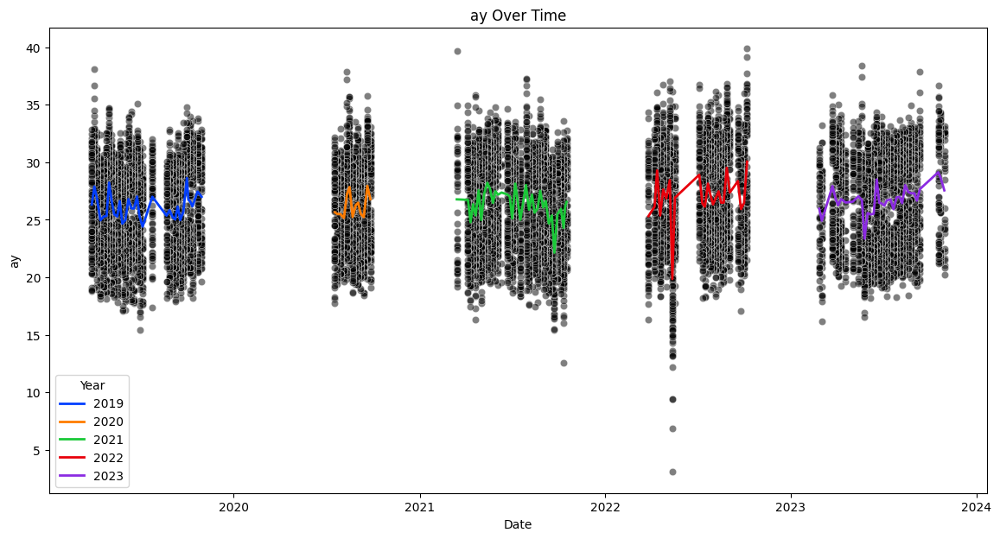

<ipython-input-6-9e2c0a3ff9bb>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')


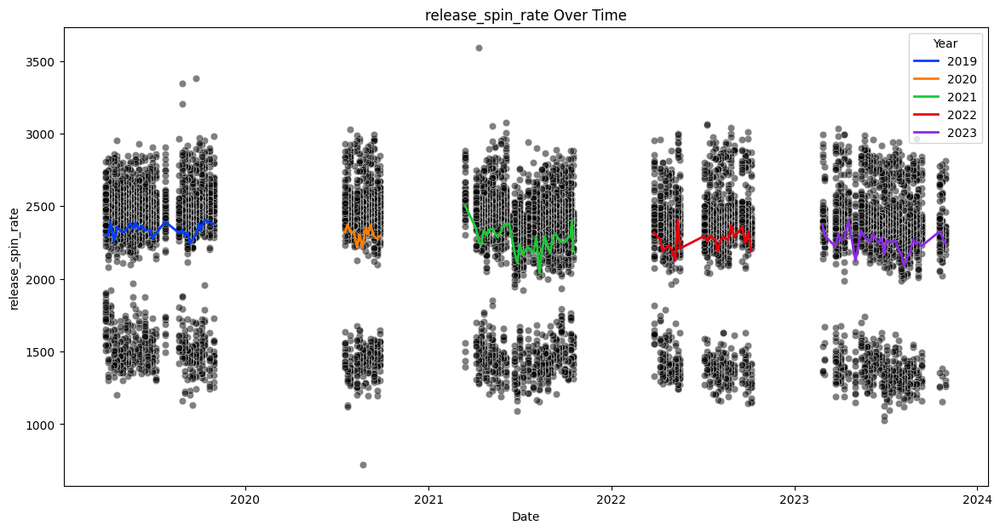

In [ ]:
# Loop over each variable
for var in variables:
    # Filter data for the current variable
    var_data = scherzer_data[['game_date', var, 'year']]

    # Plot scatterplot with all points black
    plt.figure(figsize=(14, 7))
    sns.scatterplot(data=var_data, x='game_date', y=var, color='black', alpha=0.5)

    # Plot lineplot for average value per year with a brighter color scheme and wider line
    sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette='bright')

    # Set title and labels
    plt.title(f'{var} Over Time')
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.legend(title='Year')
    plt.show()


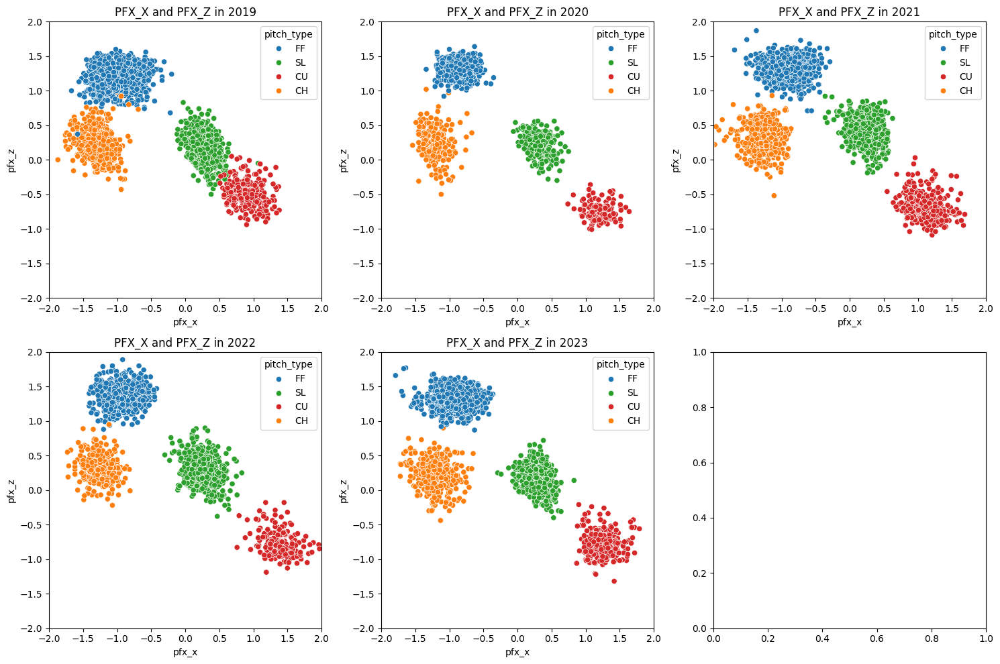

In [ ]:
# Define the list of years
years = [2019, 2020, 2021, 2022, 2023]

# Calculate the number of rows and columns for subplots
num_cols = 3
num_rows = (len(years) + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
axes = axes.flatten()

# Iterate over each year and create scatter plots
for i, year in enumerate(years):
    ax = axes[i]
    data = scherzer_data[scherzer_data['year'] == year]
    sns.scatterplot(data=data, x='pfx_x', y='pfx_z', hue='pitch_type',
                    hue_order=['FF', 'SL', 'CU', 'CH'], ax=ax, palette=pitch_palette)
    ax.set_title('PFX_X and PFX_Z in ' + str(year))
    ax.set(xlim=(-2, 2), ylim=(-2, 2))  # Adjust axis limits

# Adjust layout
plt.tight_layout()
plt.show()


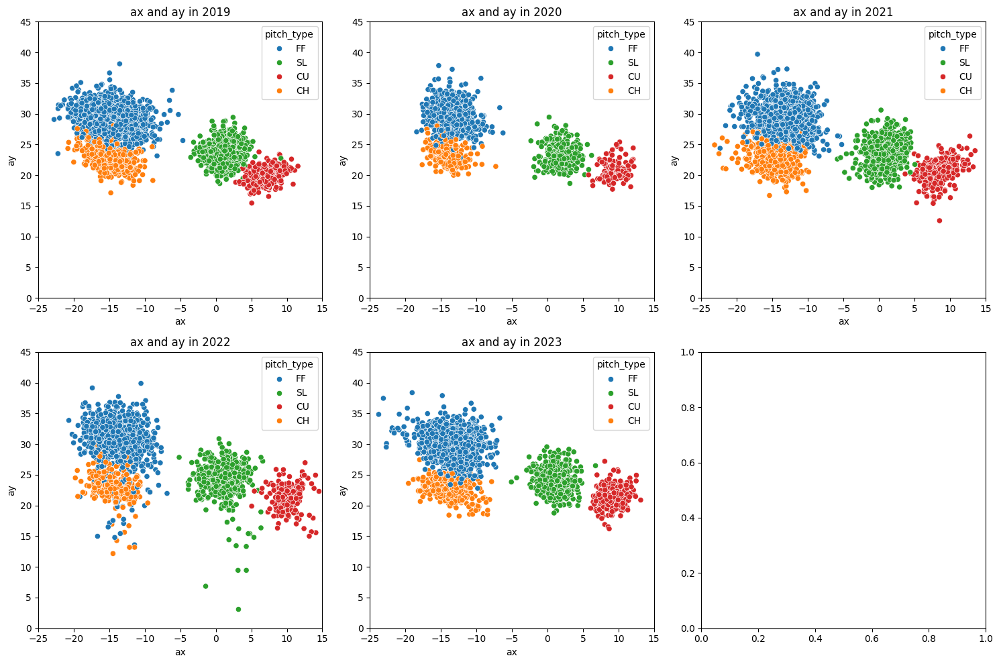

In [ ]:
# Define the list of years
years = [2019, 2020, 2021, 2022, 2023]

# Calculate the number of rows and columns for subplots
num_cols = 3
num_rows = (len(years) + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
axes = axes.flatten()

# Iterate over each year and create scatter plots
for i, year in enumerate(years):
    ax = axes[i]
    data = scherzer_data[scherzer_data['year'] == year]
    sns.scatterplot(data=data, x='ax', y='ay', hue='pitch_type',
                    hue_order=['FF', 'SL', 'CU', 'CH'], ax=ax, palette=pitch_palette)
    ax.set_title('ax and ay in ' + str(year))
    ax.set(xlim=(-25, 15), ylim=(0, 45))  # Adjust axis limits

# Adjust layout
plt.tight_layout()
plt.show()


# Jacob Degrom

In [ ]:
from pybaseball import statcast_pitcher, playerid_lookup
import pandas as pd

def get_pitcher_data(last_name, first_name, start_year, end_year):
    # Find the player's MLBAM ID
    player_info = playerid_lookup(last_name, first_name)
    player_id = player_info.iloc[0]['key_mlbam']

    # Function to get data for multiple seasons
    def get_pitcher_data_season(player_id, year):
        data = statcast_pitcher(f"{year}-01-01", f"{year}-12-31", player_id)
        data['year'] = year
        return data

    # Get data for each year in the specified range
    all_data = [get_pitcher_data_season(player_id, year) for year in range(start_year, end_year + 1)]
    pitcher_data = pd.concat(all_data, ignore_index=True)

    return pitcher_data

# Gather jacob degrom's pitching data for the desired five-year range
degrom_data = get_pitcher_data('degrom', 'jacob', 2019, 2023)

# Display the first few rows of the DataFrame
print("Jacob Degrom's Pitching Data:")
print(degrom_data.head())

Gathering Player Data
Gathering Player Data
Gathering Player Data
Gathering Player Data
Gathering Player Data
Jacob Degrom's Pitching Data:
  pitch_type   game_date  release_speed  release_pos_x  release_pos_z  \
0         SL  2019-09-25           93.1          -0.80           5.71   
1         SL  2019-09-25           92.4          -1.04           5.69   
2         SL  2019-09-25           91.4          -0.96           5.65   
3         SL  2019-09-25           92.1          -0.86           5.72   
4         FF  2019-09-25           98.5          -0.78           5.67   

     player_name  batter  pitcher     events    description  ...  \
0  deGrom, Jacob  595751   594798  field_out  hit_into_play  ...   
1  deGrom, Jacob  595751   594798        NaN           foul  ...   
2  deGrom, Jacob  595751   594798        NaN           foul  ...   
3  deGrom, Jacob  595751   594798        NaN           ball  ...   
4  deGrom, Jacob  595751   594798        NaN           ball  ...   

   post_bat_

In [ ]:
# Filter by pitch type
pitch_types = ['FF', 'CU', 'SL', 'CH']
degrom_pitch = degrom_data[degrom_data['pitch_type'].isin(pitch_types)]

# Define the columns to include in the subset
subset = ['pitch_type', 'game_date', 'release_speed', 'effective_speed', 'release_pos_x', 'release_pos_y', 'release_pos_z', 'pfx_x', 'pfx_z', 'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'release_spin_rate', 'spin_axis']

# Create the new subset by filtering the DataFrame
degrom_filtered = degrom_pitch[subset]

# Drop rows with missing values
degrom_dropna = degrom_filtered.dropna()

#final subset with primary vars of interest
new_subset = ['pitch_type', 'game_date','release_speed', 'pfx_x', 'pfx_z', 'ax', 'ay', 'release_spin_rate']
degrom_data = degrom_dropna[new_subset]

In [ ]:
# Check data dimensions
degrom_data.shape

(7104, 8)

# Jacob Degrom plots

<ipython-input-11-c75920f3df5a>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degrom_data['game_date'] = pd.to_datetime(degrom_data['game_date'])
<ipython-input-11-c75920f3df5a>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degrom_data['year'] = degrom_data['game_date'].dt.year


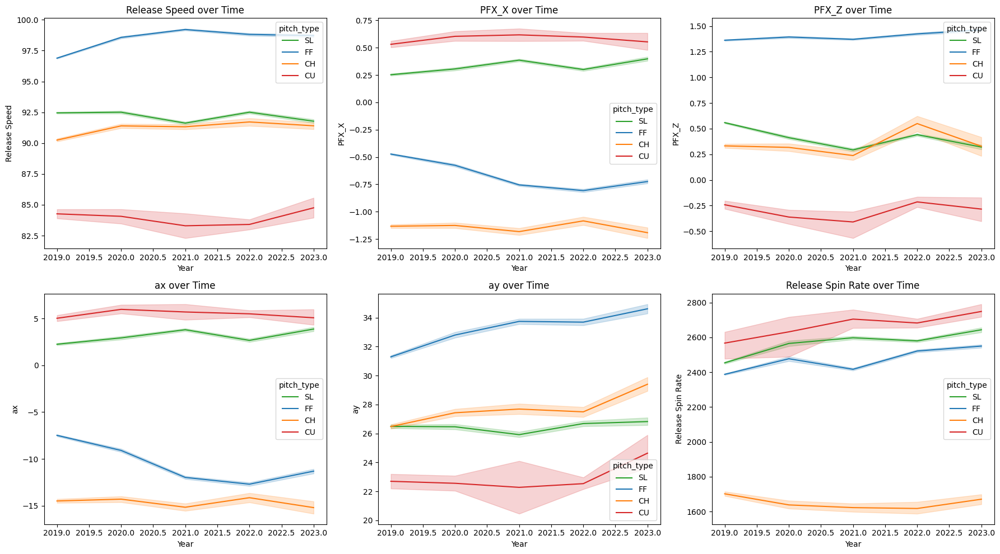

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert game_date to datetime
degrom_data['game_date'] = pd.to_datetime(degrom_data['game_date'])

# Extract year
degrom_data['year'] = degrom_data['game_date'].dt.year

# Create a custom color palette for the pitch types
pitch_palette = {
    'FF': '#1f77b4',  # Blue
    'CH': '#ff7f0e',  # Orange
    'SL': '#2ca02c',  # Green
    'CU': '#d62728'   # Red
}

# Create a 2x3 grid for subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Line plot for Release Speed over Time
sns.lineplot(data=degrom_data, x='year', y='release_speed', hue='pitch_type', ax=axes[0, 0], palette=pitch_palette)
axes[0, 0].set_title('Release Speed over Time')
axes[0, 0].set_xlabel('Year')
axes[0, 0].set_ylabel('Release Speed')

# Line plot for PFX_X over Time
sns.lineplot(data=degrom_data, x='year', y='pfx_x', hue='pitch_type', ax=axes[0, 1], palette=pitch_palette)
axes[0, 1].set_title('PFX_X over Time')
axes[0, 1].set_xlabel('Year')
axes[0, 1].set_ylabel('PFX_X')

# Line plot for PFX_Z over Time
sns.lineplot(data=degrom_data, x='year', y='pfx_z', hue='pitch_type', ax=axes[0, 2], palette=pitch_palette)
axes[0, 2].set_title('PFX_Z over Time')
axes[0, 2].set_xlabel('Year')
axes[0, 2].set_ylabel('PFX_Z')

# Line plot for ax over Time
sns.lineplot(data=degrom_data, x='year', y='ax', hue='pitch_type', ax=axes[1, 0], palette=pitch_palette)
axes[1, 0].set_title('ax over Time')
axes[1, 0].set_xlabel('Year')
axes[1, 0].set_ylabel('ax')

# Line plot for ay over Time
sns.lineplot(data=degrom_data, x='year', y='ay', hue='pitch_type', ax=axes[1, 1], palette=pitch_palette)
axes[1, 1].set_title('ay over Time')
axes[1, 1].set_xlabel('Year')
axes[1, 1].set_ylabel('ay')

# Line plot for Release Spin Rate over Time
sns.lineplot(data=degrom_data, x='year', y='release_spin_rate', hue='pitch_type', ax=axes[1, 2], palette=pitch_palette)
axes[1, 2].set_title('Release Spin Rate over Time')
axes[1, 2].set_xlabel('Year')
axes[1, 2].set_ylabel('Release Spin Rate')

# Adjust layout
plt.tight_layout()
plt.show()


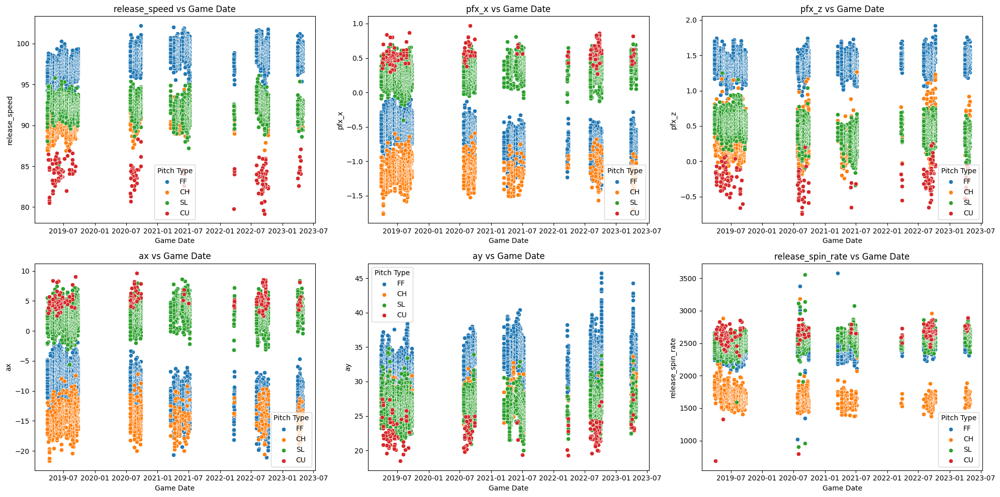

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the list of variables
variables = ['release_speed', 'pfx_x', 'pfx_z', 'ax', 'ay', 'release_spin_rate']

# Custom color palette for the pitch types
pitch_palette = {
    'FF': '#1f77b4',  # Blue
    'CH': '#ff7f0e',  # Orange
    'SL': '#2ca02c',  # Green
    'CU': '#d62728'   # Red
}

# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate over each variable and create scatter plots
for i, var in enumerate(variables):
    # Scatter plot for the current variable
    for pitch_type, color in pitch_palette.items():
        data_filtered = degrom_data[degrom_data['pitch_type'] == pitch_type]
        sns.scatterplot(data=data_filtered, x='game_date', y=var, ax=axes[i], color=color, label=pitch_type)
    axes[i].set_title(f'{var} vs Game Date')
    axes[i].set_xlabel('Game Date')
    axes[i].set_ylabel(var)
    axes[i].legend(title='Pitch Type')

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-14-71f99e065b30>:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)


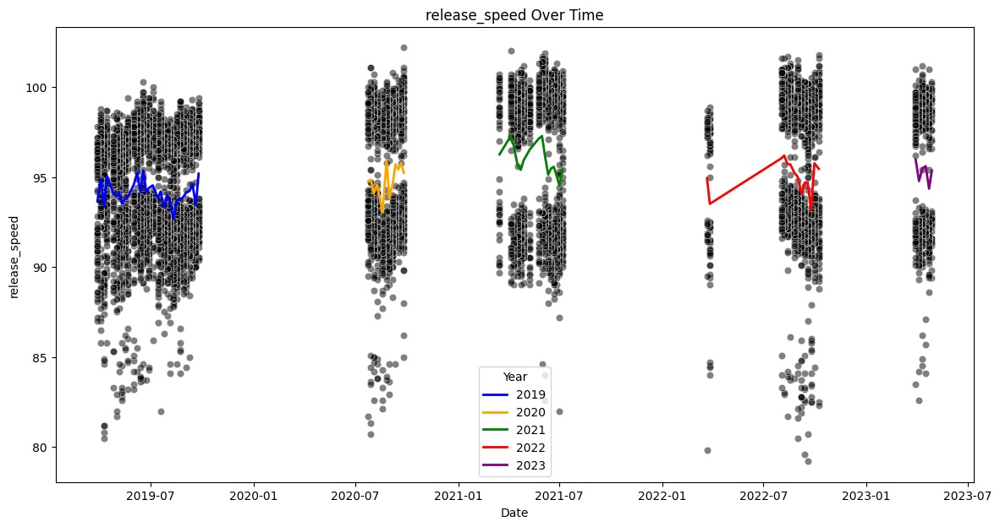

<ipython-input-14-71f99e065b30>:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)


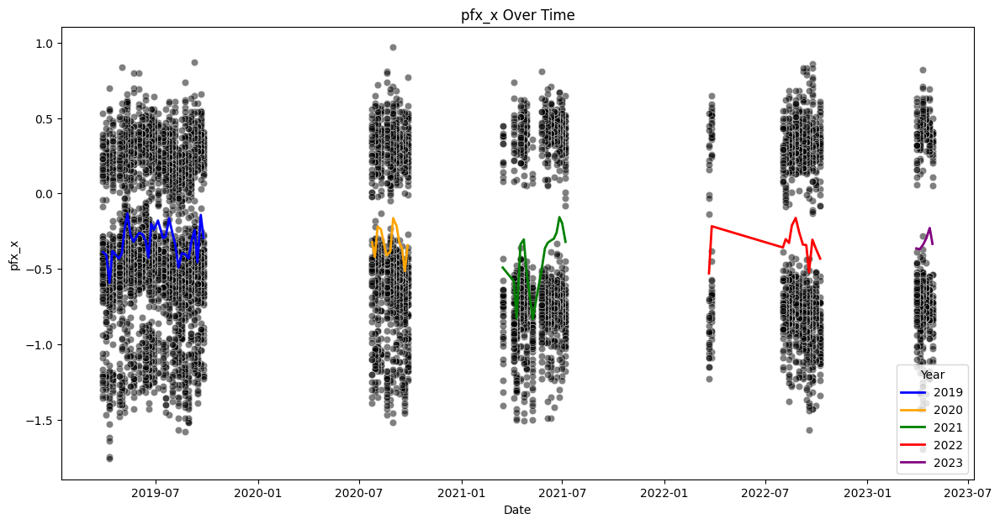

<ipython-input-14-71f99e065b30>:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)


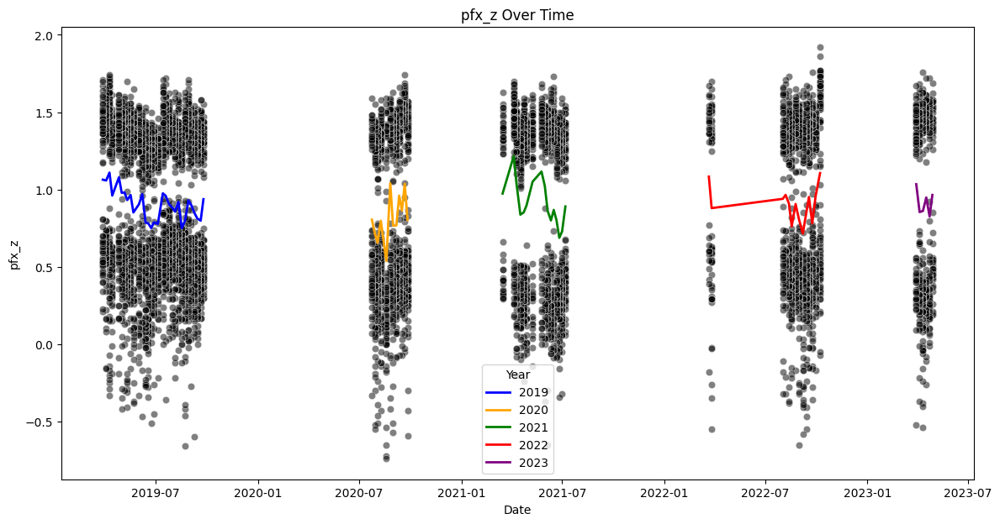

<ipython-input-14-71f99e065b30>:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)


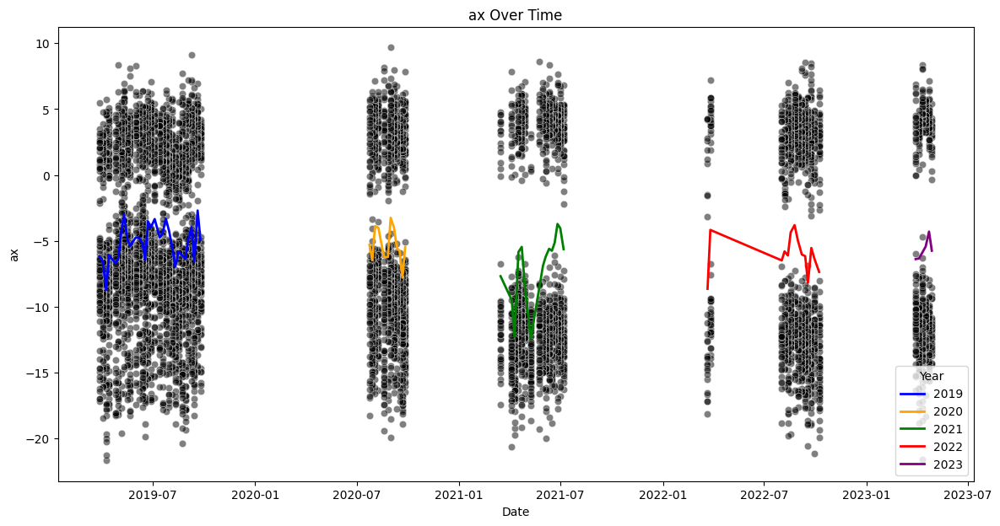

<ipython-input-14-71f99e065b30>:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)


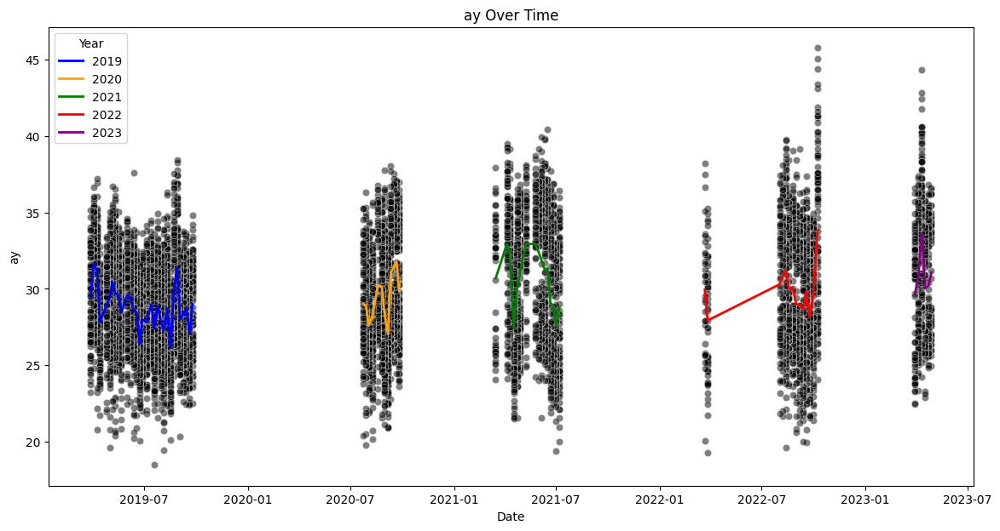

<ipython-input-14-71f99e065b30>:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)


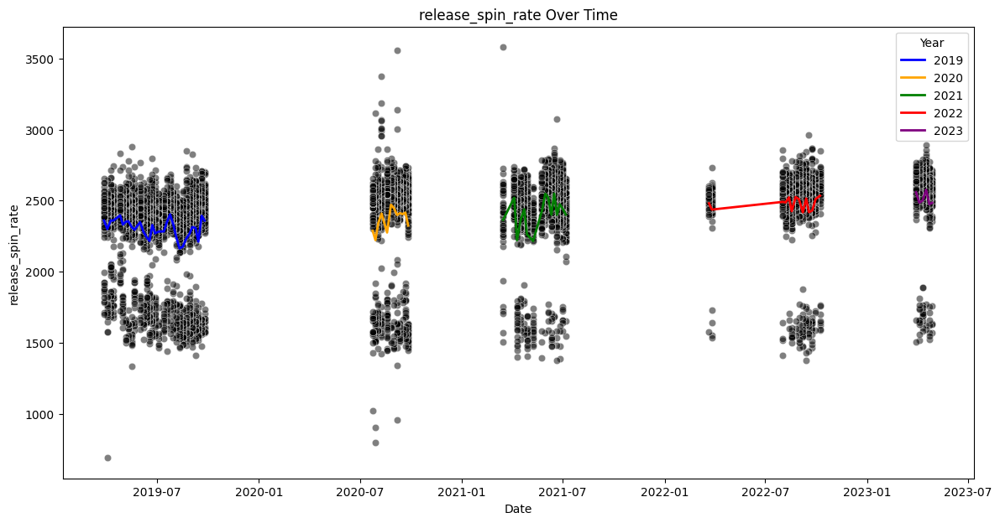

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Variables to plot
variables = ['release_speed', 'pfx_x', 'pfx_z', 'ax', 'ay', 'release_spin_rate']

# Custom color palette for the years
year_palette = {
    2019: 'blue',
    2020: 'orange',
    2021: 'green',
    2022: 'red',
    2023: 'purple'
}

# Loop over each variable
for var in variables:
    # Filter data for the current variable
    var_data = degrom_data[['game_date', var, 'year']]

    # Plot scatterplot with all points black
    plt.figure(figsize=(14, 7))
    sns.scatterplot(data=var_data, x='game_date', y=var, color='black', alpha=0.5)

    # Plot lineplot for average value per year with a custom color scheme
    sns.lineplot(data=var_data, x='game_date', y=var, hue='year', estimator='mean', ci=None, lw=2, palette=year_palette)

    # Set title and labels
    plt.title(f'{var} Over Time')
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.legend(title='Year')
    plt.show()


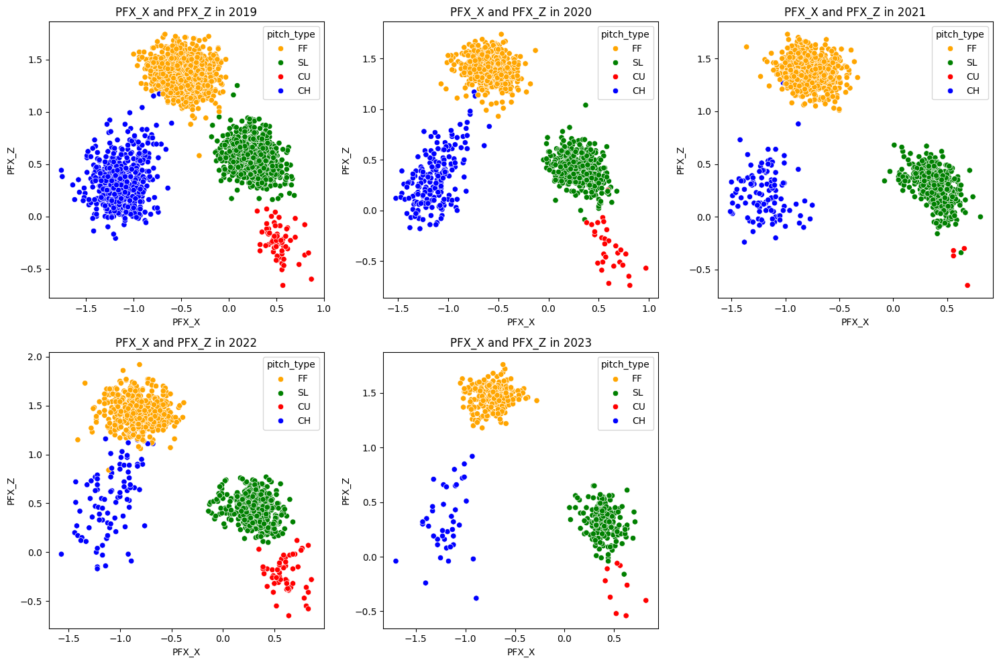

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Custom color palette
custom_palette = {
    'CH': 'blue',
    'FF': 'orange',
    'SL': 'green',
    'CU': 'red'
}

# Define the years
years = [2019, 2020, 2021, 2022, 2023]

# Determine the number of rows and columns for the subplots
num_cols = 3
num_rows = (len(years) + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot pfx_x and pfx_z for each year
for i, year in enumerate(years):
    ax = axes[i]
    data = degrom_data[degrom_data['year'] == year]
    sns.scatterplot(data=data, x='pfx_x', y='pfx_z', hue='pitch_type',
                    hue_order=['FF', 'SL', 'CU', 'CH'], palette=custom_palette, ax=ax)
    ax.set_title('PFX_X and PFX_Z in ' + str(year))
    ax.set_xlabel('PFX_X')
    ax.set_ylabel('PFX_Z')
    ax.set(xlim=(-2, 2), ylim=(-2, 2.5))
# Remove any empty subplots
for j in range(len(years), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


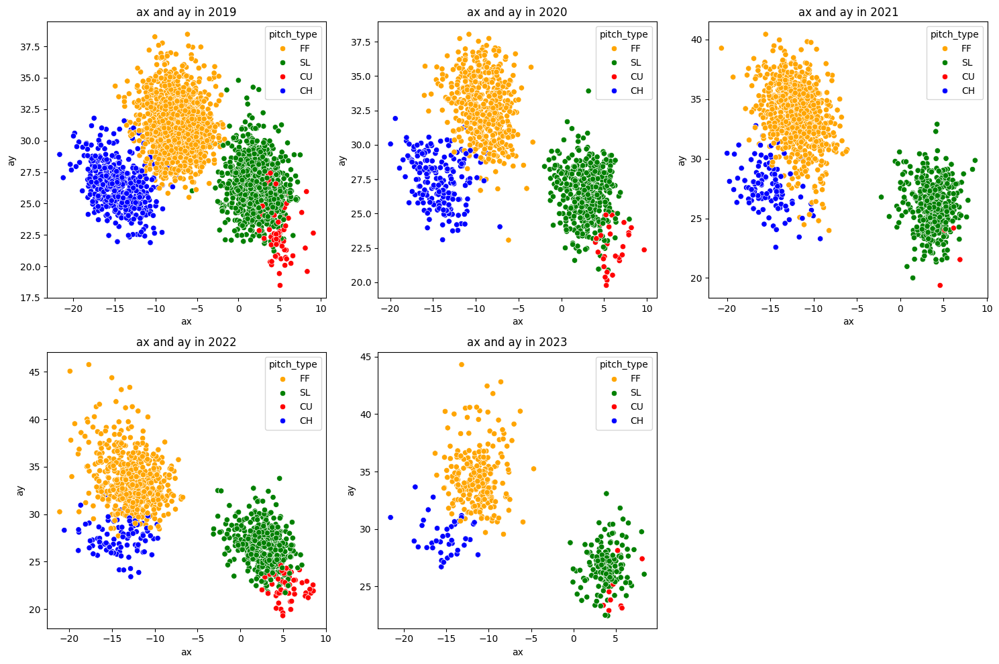

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Custom color palette
custom_palette = {
    'CH': 'blue',
    'FF': 'orange',
    'SL': 'green',
    'CU': 'red'
}

# Define the years
years = [2019, 2020, 2021, 2022, 2023]

# Determine the number of rows and columns for the subplots
num_cols = 3
num_rows = (len(years) + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot ax and ay for each year
for i, year in enumerate(years):
    ax = axes[i]
    data = degrom_data[degrom_data['year'] == year]
    sns.scatterplot(data=data, x='ax', y='ay', hue='pitch_type',
                    hue_order=['FF', 'SL', 'CU', 'CH'], palette=custom_palette, ax=ax)
    ax.set_title('ax and ay in ' + str(year))
    ax.set_xlabel('ax')
    ax.set_ylabel('ay')

# Remove any empty subplots
for j in range(len(years), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


# Comparison plots

<ipython-input-11-76c202a28d89>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scherzer_data['game_date'] = pd.to_datetime(scherzer_data['game_date'])
<ipython-input-11-76c202a28d89>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degrom_data['game_date'] = pd.to_datetime(degrom_data['game_date'])
<ipython-input-11-76c202a28d89>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

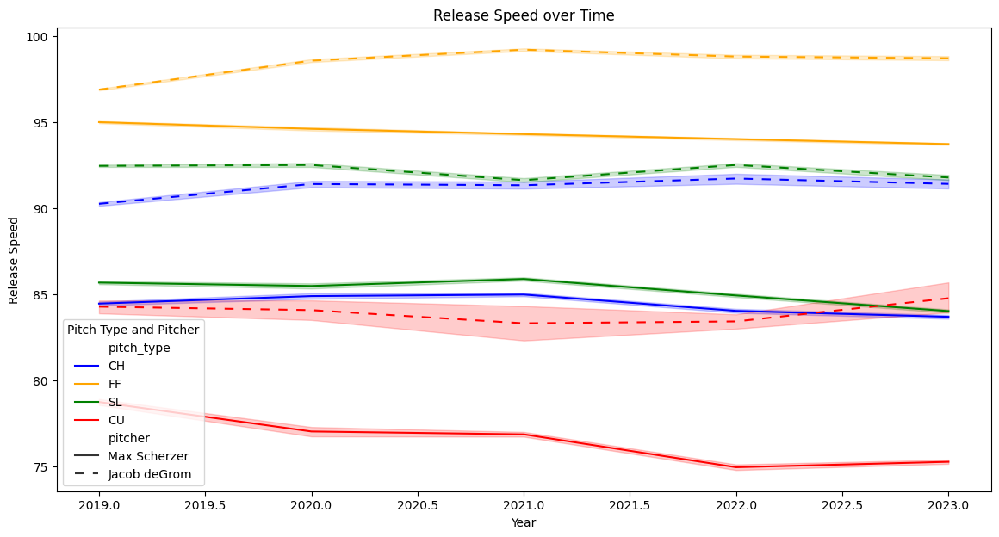

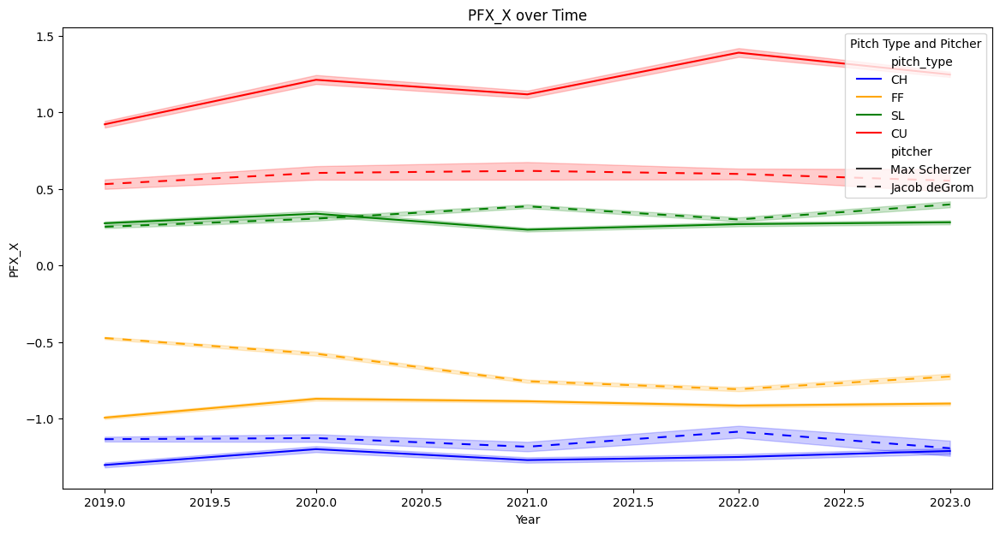

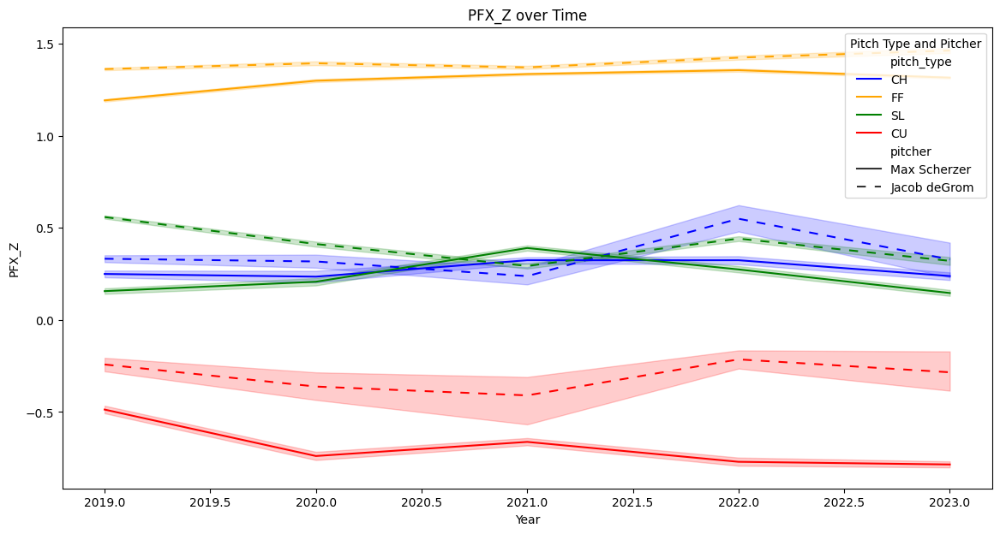

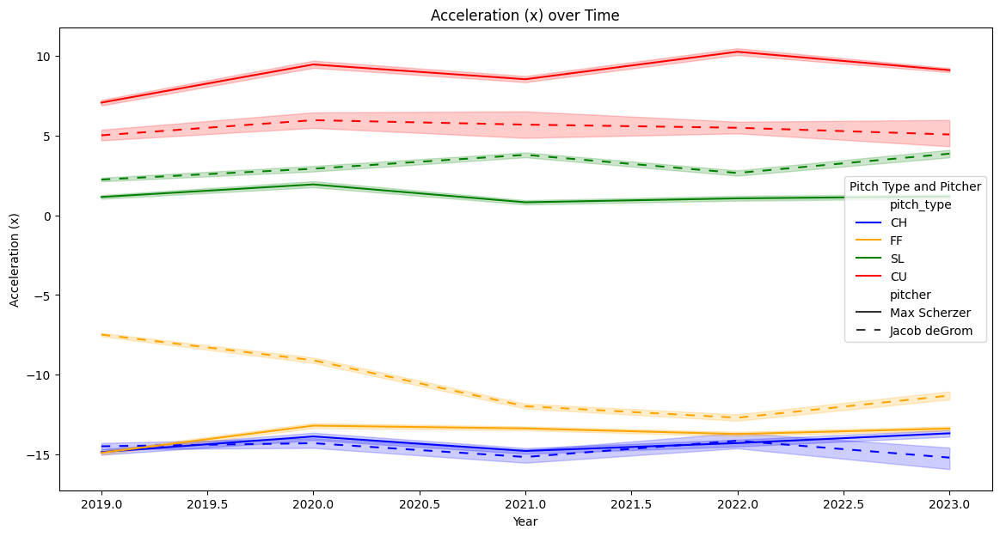

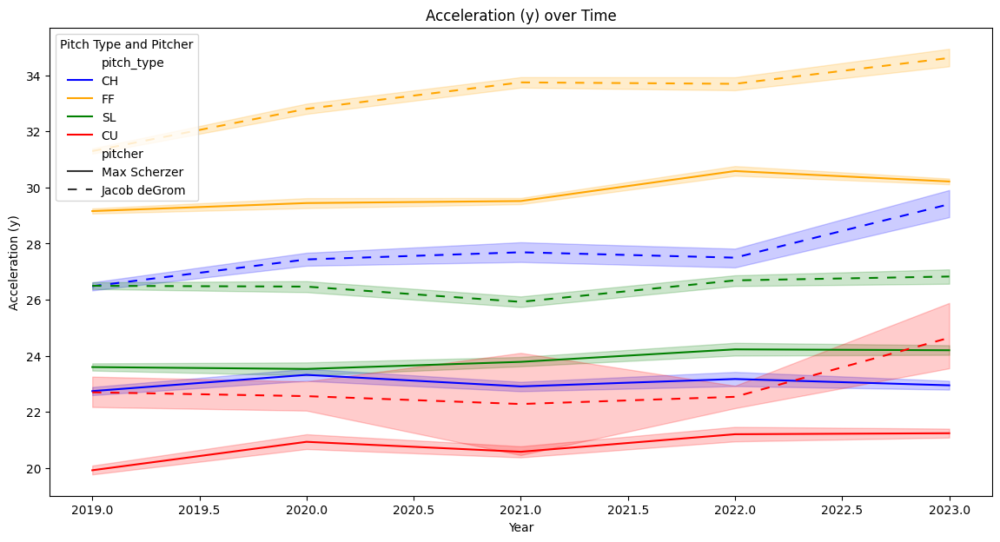

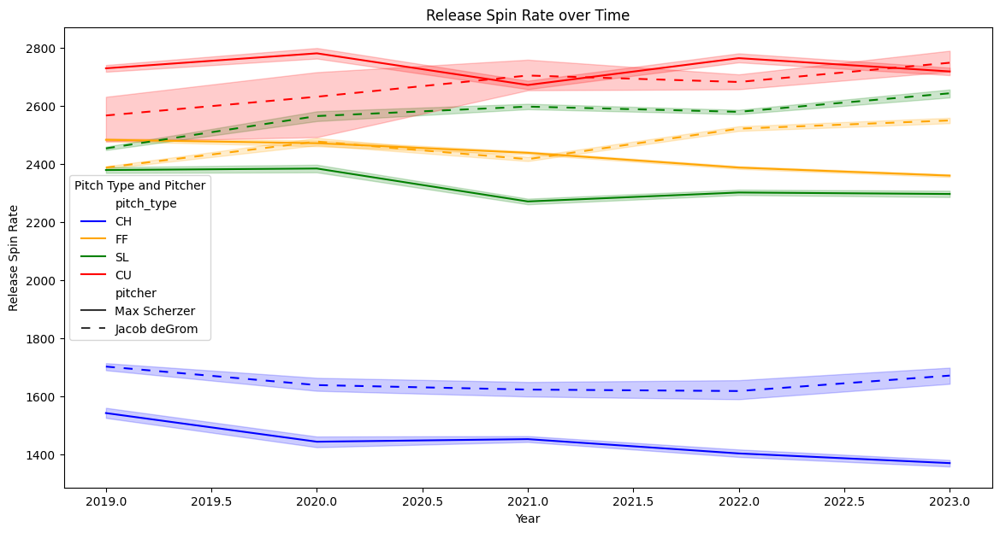

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Convert game_date to datetime
scherzer_data['game_date'] = pd.to_datetime(scherzer_data['game_date'])
degrom_data['game_date'] = pd.to_datetime(degrom_data['game_date'])

# Extract year
scherzer_data['year'] = scherzer_data['game_date'].dt.year
degrom_data['year'] = degrom_data['game_date'].dt.year

# Add a pitcher column to each dataset
scherzer_data['pitcher'] = 'Max Scherzer'
degrom_data['pitcher'] = 'Jacob deGrom'

# Combine the datasets
combined_data = pd.concat([scherzer_data, degrom_data])

# Define the custom color palette
custom_palette = {
    'CH': 'blue',
    'FF': 'orange',
    'SL': 'green',
    'CU': 'red'
}

# Plot Release Speed over Time
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data, x='year', y='release_speed', hue='pitch_type', style='pitcher',
             dashes={'Max Scherzer': '', 'Jacob deGrom': (5, 5)}, palette=custom_palette)
plt.title('Release Speed over Time')
plt.xlabel('Year')
plt.ylabel('Release Speed')
plt.legend(title='Pitch Type and Pitcher')
plt.show()

# Plot PFX_X over Time
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data, x='year', y='pfx_x', hue='pitch_type', style='pitcher',
             dashes={'Max Scherzer': '', 'Jacob deGrom': (5, 5)}, palette=custom_palette)
plt.title('PFX_X over Time')
plt.xlabel('Year')
plt.ylabel('PFX_X')
plt.legend(title='Pitch Type and Pitcher')
plt.show()

# Plot PFX_Z over Time
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data, x='year', y='pfx_z', hue='pitch_type', style='pitcher',
             dashes={'Max Scherzer': '', 'Jacob deGrom': (5, 5)}, palette=custom_palette)
plt.title('PFX_Z over Time')
plt.xlabel('Year')
plt.ylabel('PFX_Z')
plt.legend(title='Pitch Type and Pitcher')
plt.show()

# Plot AX over Time
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data, x='year', y='ax', hue='pitch_type', style='pitcher',
             dashes={'Max Scherzer': '', 'Jacob deGrom': (5, 5)}, palette=custom_palette)
plt.title('Acceleration (x) over Time')
plt.xlabel('Year')
plt.ylabel('Acceleration (x)')
plt.legend(title='Pitch Type and Pitcher')
plt.show()

# Plot AY over Time
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data, x='year', y='ay', hue='pitch_type', style='pitcher',
             dashes={'Max Scherzer': '', 'Jacob deGrom': (5, 5)}, palette=custom_palette)
plt.title('Acceleration (y) over Time')
plt.xlabel('Year')
plt.ylabel('Acceleration (y)')
plt.legend(title='Pitch Type and Pitcher')
plt.show()

# Plot Release Spin Rate over Time
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data, x='year', y='release_spin_rate', hue='pitch_type', style='pitcher',
             dashes={'Max Scherzer': '', 'Jacob deGrom': (5, 5)}, palette=custom_palette)
plt.title('Release Spin Rate over Time')
plt.xlabel('Year')
plt.ylabel('Release Spin Rate')
plt.legend(title='Pitch Type and Pitcher')
plt.show()
